In [102]:
# http://sceneparsing.csail.mit.edu/

In [103]:
!pip install torch torchvision torchaudio matplotlib numpy opencv-python

In [104]:
import os
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from torchvision.transforms import functional as TF

In [105]:
# # Jupyter-Notebook specific setup
# import os
# repo_dir = r"C:\Users\Aourbro\Desktop\green_ratio"
# os.chdir(repo_dir)

In [106]:
# !pip install yacs 2>&1 >> install.log
# !git init 2>&1 >> install.log
# !git remote add origin https://github.com/CSAILVision/semantic-segmentation-pytorch.git 2>> install.log
# !git pull origin master 2>&1>> install.log
# !DOWNLOAD_ONLY=1 ./demo_test.sh 2>> install.log

In [107]:
# Colab-specific setup
%%bash
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit
pip install yacs 2>&1 >> install.log
git init 2>&1 >> install.log
git remote add origin https://github.com/CSAILVision/semantic-segmentation-pytorch.git 2>> install.log
git pull origin master 2>&1 >> install.log
DOWNLOAD_ONLY=1 ./demo_test.sh 2>> install.log

From https://github.com/CSAILVision/semantic-segmentation-pytorch
 * branch            master     -> FETCH_HEAD


In [108]:
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='encoder_tuned.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='decoder_tuned.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
segmentation_module.to(device)

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

In [109]:
def img_process(img_path):
    pil_to_tensor = torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(
            mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
            std=[0.229, 0.224, 0.225])  # across a large photo dataset.
    ])
    pil_image = PIL.Image.open(img_path).convert('RGB')
    img_original = numpy.array(pil_image)
    img_data = pil_to_tensor(pil_image)
    singleton_batch = {'img_data': img_data[None].cuda()}
    output_size = img_data.shape[1:]
    return singleton_batch, output_size, img_original

In [110]:
colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)  # Skip the header
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]


In [111]:
from PIL import Image
import numpy as np
import PIL.Image as PILImage

def visualize_result(img, pred, index=None):
    if index is not None:
        pred = np.where(pred == index, pred, -1)  # Filter to show only class of interest
        print(f'{names.get(index, "Unknown")}')

    # Assuming colorEncode returns a NumPy array and needs conversion to PIL image for further processing
    pred_color = colorEncode(pred, colors).astype(np.uint8)
    pred_pil = PILImage.fromarray(pred_color)  # Convert numpy array to PIL Image
    pred_rgba = pred_pil.convert('RGB')

    img_pil = PILImage.fromarray(img)
    img_overlay = img_pil.convert('RGB')

    # Blend images
    img_combined = Image.blend(img_overlay, pred_rgba, 0.5)

    # Convert combined image back to array for concatenation and display
    img_combined = np.array(img_combined)
    img_final = np.concatenate((img, pred_color, img_combined), axis=1)
    display(PILImage.fromarray(img_final))

#     pred_array = np.array(pred_color)
#     pred_tensor = torch.from_numpy(pred_array)
#     print(torch.unique(pred_tensor))

    green_classes = [5, 10, 18, 30, 67]
    green_mask = np.isin(pred, green_classes)

    green_pixel_count = np.sum(green_mask)
    total_pixels = img.shape[0]*img.shape[1]
    green_ratio = green_pixel_count / total_pixels

    return green_ratio

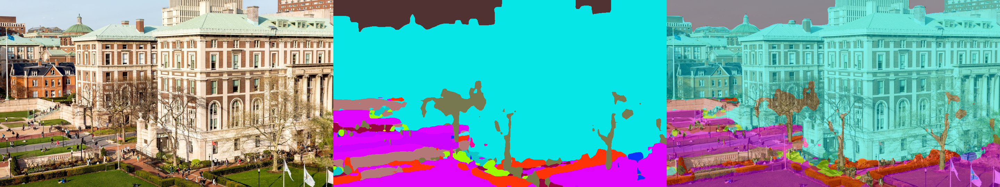

green_ratio in this picture is: 0.19246720679012347


In [112]:
import matplotlib.pyplot as plt

img_original = None
with torch.no_grad():
    singleton_batch, output_size, img_original = img_process('test0.jpg')
    scores = segmentation_module(singleton_batch, segSize=output_size)

# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()
pred += 1
pred[pred == 150] = 0
green_ratio = visualize_result(img_original, pred)
print(f"green_ratio in this picture is: {green_ratio}")

In [113]:
# torch.save(deepv3_model.state_dict(), './model_weights/deepv3_model_p5.pth')

building


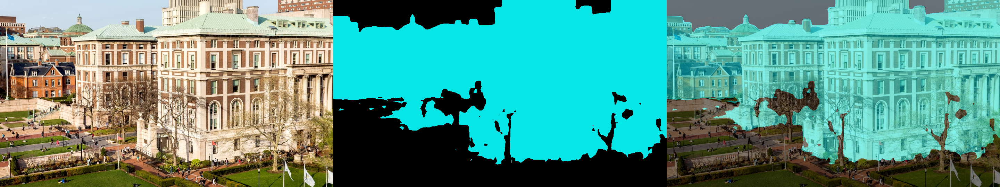

grass


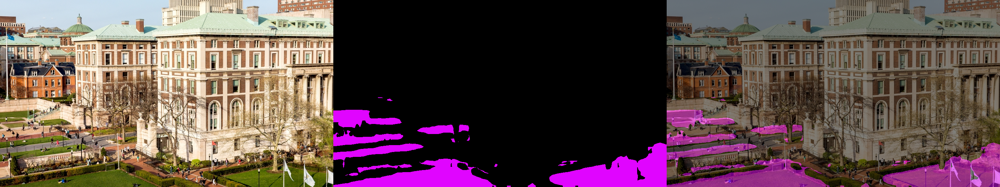

sky


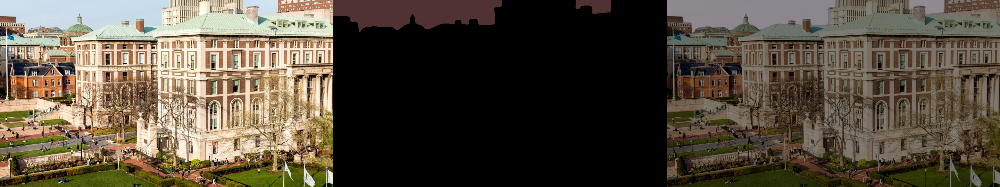

plant


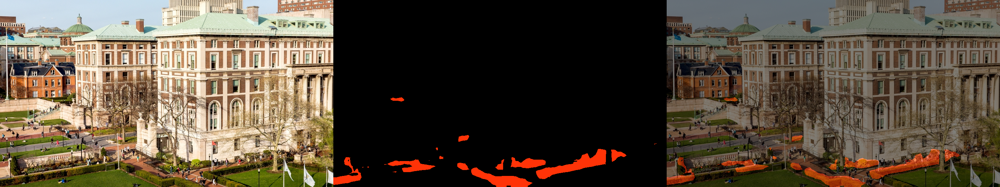

wall


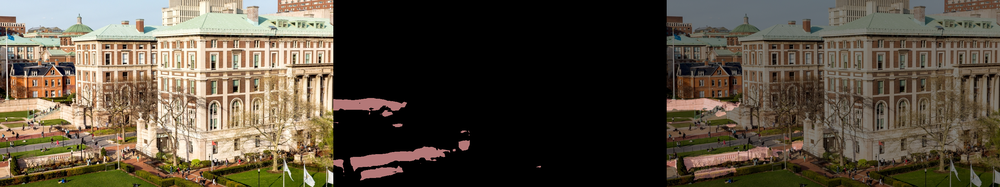

tree


In [ ]:
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:15]:
    visualize_result(img_original, pred, c)

In [ ]:
predicted_classes

array([ 2,  6, 32,  1,  4, 11, 17,  9,  0, 16, 14, 93, 13, 81, 29, 22, 23,
       24, 25, 26, 27, 28, 30, 20, 31, 82, 33, 34, 35, 36, 37, 38, 21, 19,
       80,  8, 91, 90,  3, 89,  5, 88,  7, 87, 18, 10, 86, 12, 85, 15, 84,
       83, 39, 40, 41, 42, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
       75, 76, 77, 78, 79, 62, 61, 60, 50, 43, 44, 45, 92, 47, 48, 49, 51,
       59, 52, 53, 54, 55, 56, 57, 58, 46], dtype=int64)

In [114]:
!pip install opendatasets

In [115]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/rohanmyer/geotagged-streetview-images-15k")
# 92ff2a7b69690279df2e7b575d496967

Skipping, found downloaded files in "./geotagged-streetview-images-15k" (use force=True to force download)


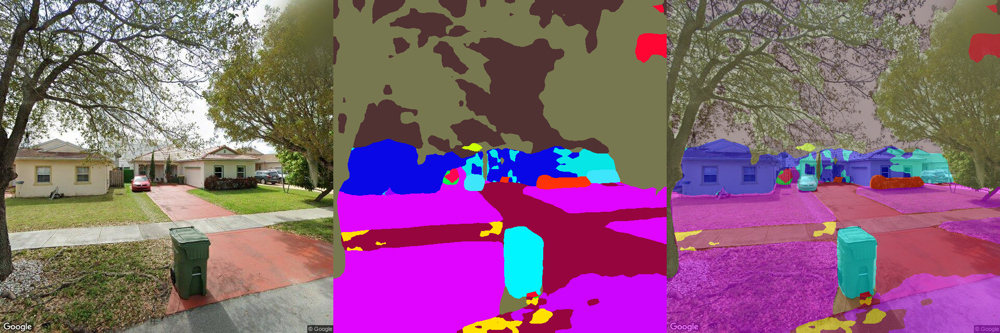

green_ratio in this picture is: 0.53991943359375


In [116]:
import matplotlib.pyplot as plt

folder_path = 'geotagged-streetview-images-15k/streetviews/US'

img_original = None
with torch.no_grad():
    singleton_batch, output_size, img_original = img_process(folder_path + '/25.47146,-80.47908.jpg')
    scores = segmentation_module(singleton_batch, segSize=output_size)

# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()
pred += 1
pred[pred == 150] = 0
green_ratio = visualize_result(img_original, pred)
print(f"green_ratio in this picture is: {green_ratio}")

<ipython-input-117-30749c104096>:23: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  usa = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


<Axes: >

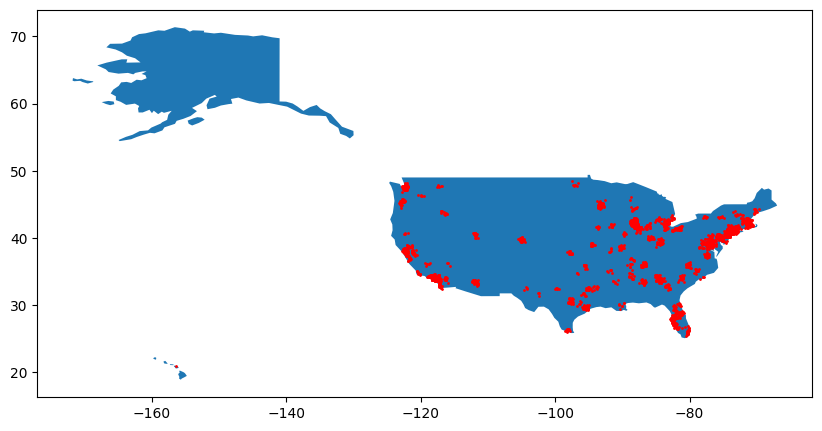

In [117]:
import os
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

folder_path = 'geotagged-streetview-images-15k/streetviews/US'

data = []

for filename in os.listdir(folder_path):
    if filename.endswith(".jpg"):

        basename = os.path.splitext(filename)[0]
        latitude, longitude = map(float, basename.split(','))
        data.append({'Longitude': longitude, 'Latitude': latitude})

df = pd.DataFrame(data)

geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
gdf = GeoDataFrame(df, geometry=geometry)

usa = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
usa = usa[usa['name'] == 'United States of America']
ax = usa.plot(figsize=(10, 6))
gdf.plot(ax=ax, marker='o', color='red', markersize=1)


In [118]:
import os
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
import matplotlib.pyplot as plt

folder_path = 'geotagged-streetview-images-15k/streetviews/US'


data = []


for filename in os.listdir(folder_path):
    if filename.endswith(".jpg"):

        basename = os.path.splitext(filename)[0]
        latitude, longitude = map(float, basename.split(','))
        data.append({'Filename': filename, 'Longitude': longitude, 'Latitude': latitude})

df = pd.DataFrame(data)

geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
points_gdf = GeoDataFrame(df, geometry=geometry)

path_to_usa_states = 'ne_110m_admin_1_states_provinces.shp'
states = gpd.read_file(path_to_usa_states)

california = states[states['name'] == 'California']
newyork = states[states['name'] == 'New York']
florida = states[states['name'] == 'Florida']
kansas = states[states['name'] == 'Kansas']
illinois = states[states['name'] == 'Illinois']


points_in_california = gpd.sjoin(points_gdf, california, how="inner", op='within')
points_in_newyork = gpd.sjoin(points_gdf, newyork, how="inner", op='within')
points_in_florida = gpd.sjoin(points_gdf, florida, how="inner", op='within')
points_in_kansas = gpd.sjoin(points_gdf, kansas, how="inner", op='within')
points_in_illinois = gpd.sjoin(points_gdf, illinois, how="inner", op='within')

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate

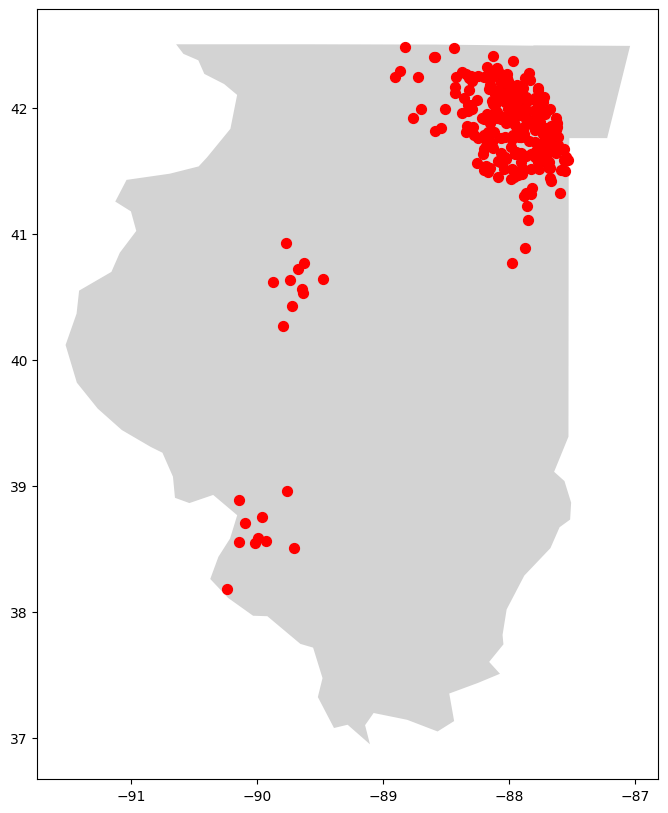

In [119]:
fig, ax = plt.subplots(figsize=(10, 10))
# california.plot(ax=ax, color='lightgray')
# new_york.plot(ax=ax, color='lightgray')
# florida.plot(ax=ax, color='lightgray')
# kansas.plot(ax=ax, color='lightgray')
illinois.plot(ax=ax, color='lightgray')

# points_in_california.plot(ax=ax, marker='o', color='red', markersize=50)
# points_in_newyork.plot(ax=ax, marker='o', color='red', markersize=50)
# points_in_florida.plot(ax=ax, marker='o', color='red', markersize=50)
# points_in_kansas.plot(ax=ax, marker='o', color='red', markersize=50)
points_in_illinois.plot(ax=ax, marker='o', color='red', markersize=50)

plt.show()

In [120]:
def get_green_ratio(img, pred, index=None):
    if index is not None:
        pred = np.where(pred == index, pred, -1)  # Filter to show only class of interest
        print(f'{names.get(index, "Unknown")}')

    # Assuming colorEncode returns a NumPy array and needs conversion to PIL image for further processing
    pred_color = colorEncode(pred, colors).astype(np.uint8)

    green_classes = [5, 10, 18, 30, 67]
    green_mask = np.isin(pred, green_classes)

    green_pixel_count = np.sum(green_mask)
    total_pixels = img.shape[0]*img.shape[1]
    green_ratio = green_pixel_count / total_pixels

    return green_ratio

In [121]:
def process_image(filename):
    img = 'geotagged-streetview-images-15k/streetviews/US/' + filename
    with torch.no_grad():
        singleton_batch, output_size, img_original = img_process(img)
        scores = segmentation_module(singleton_batch, segSize=output_size)

    _, pred = torch.max(scores, dim=1)
    pred = pred.cpu()[0].numpy()
    pred += 1
    pred[pred == 150] = 0
    green_ratio = get_green_ratio(img_original, pred)
    return green_ratio

In [122]:
points_in_california['green_ratio'] = points_in_california['Filename'].apply(lambda x: process_image(x))
# points_in_newyork['green_ratio'] = points_in_newyork['Filename'].apply(lambda x: process_image(x))
# points_in_florida['green_ratio'] = points_in_florida['Filename'].apply(lambda x: process_image(x))
# points_in_kansas['green_ratio'] = points_in_kansas['Filename'].apply(lambda x: process_image(x))
# points_in_illinois['green_ratio'] = points_in_illinois['Filename'].apply(lambda x: process_image(x))

In [123]:
points_in_newyork['green_ratio'] = points_in_newyork['Filename'].apply(lambda x: process_image(x))

In [124]:
points_in_florida['green_ratio'] = points_in_florida['Filename'].apply(lambda x: process_image(x))

In [125]:
points_in_kansas['green_ratio'] = points_in_kansas['Filename'].apply(lambda x: process_image(x))

In [126]:
points_in_illinois['green_ratio'] = points_in_illinois['Filename'].apply(lambda x: process_image(x))

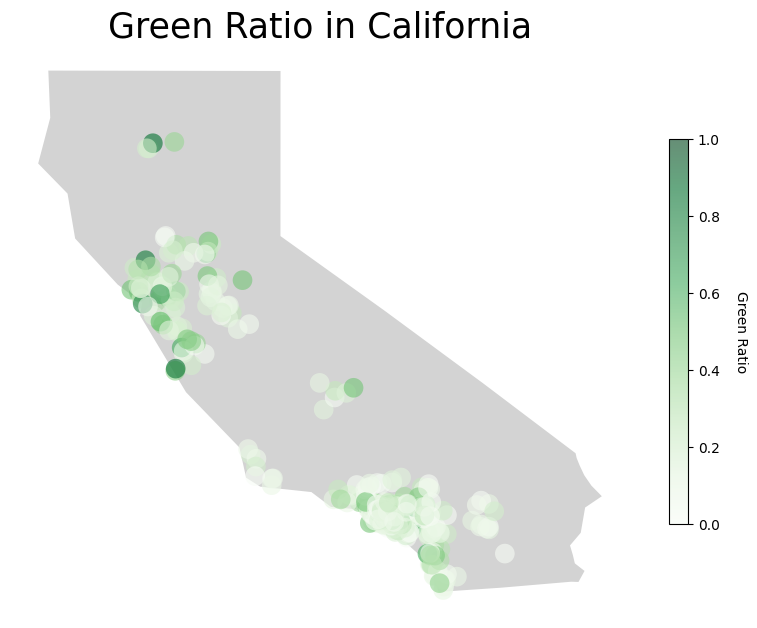

In [128]:
fig, ax = plt.subplots(figsize=(10, 10))
california.plot(ax=ax, color='lightgray')

# vmin, vmax = points_in_california['green_ratio'].min(), points_in_california['green_ratio'].max()
vmin, vmax = 0, 1

points_scatter = ax.scatter(points_in_california.geometry.x, points_in_california.geometry.y,
                            c=points_in_california['green_ratio'], cmap='Greens',
                            edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)

ax.axis('off')
ax.set_title('Green Ratio in California', fontdict={'fontsize': '25', 'fontweight' : '3'})

cbar = fig.colorbar(points_scatter, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Green Ratio', rotation=270, labelpad=20)

plt.show()

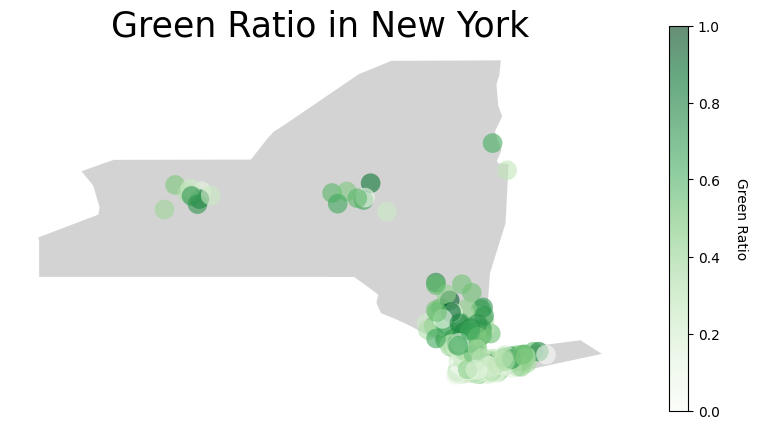

In [129]:
fig, ax = plt.subplots(figsize=(10, 10))
newyork.plot(ax=ax, color='lightgray')

# vmin, vmax = points_in_newyork['green_ratio'].min(), points_in_newyork['green_ratio'].max()
vmin, vmax = 0, 1

points_scatter = ax.scatter(points_in_newyork.geometry.x, points_in_newyork.geometry.y,
                            c=points_in_newyork['green_ratio'], cmap='Greens',
                            edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)

ax.axis('off')
ax.set_title('Green Ratio in New York', fontdict={'fontsize': '25', 'fontweight' : '3'})

cbar = fig.colorbar(points_scatter, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Green Ratio', rotation=270, labelpad=20)

plt.show()

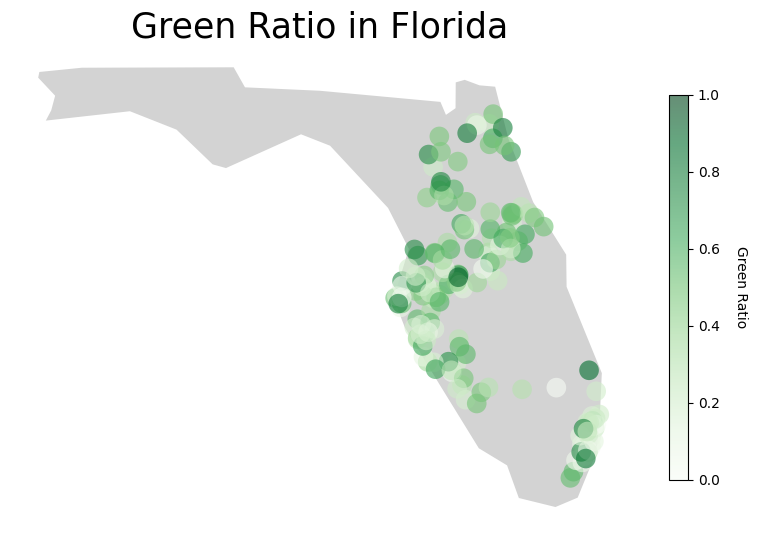

In [130]:
fig, ax = plt.subplots(figsize=(10, 10))
florida.plot(ax=ax, color='lightgray')

# vmin, vmax = points_in_florida['green_ratio'].min(), points_in_florida['green_ratio'].max()
vmin, vmax = 0, 1

points_scatter = ax.scatter(points_in_florida.geometry.x, points_in_florida.geometry.y,
                            c=points_in_florida['green_ratio'], cmap='Greens',
                            edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)

ax.axis('off')
ax.set_title('Green Ratio in Florida', fontdict={'fontsize': '25', 'fontweight' : '3'})

cbar = fig.colorbar(points_scatter, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Green Ratio', rotation=270, labelpad=20)

plt.show()

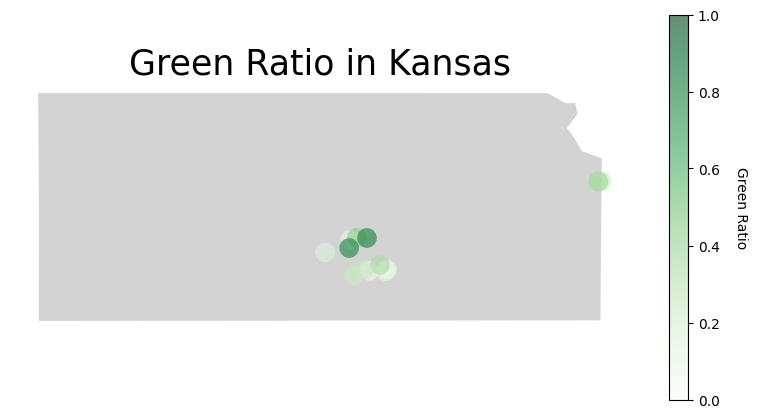

In [131]:
fig, ax = plt.subplots(figsize=(10, 10))
kansas.plot(ax=ax, color='lightgray')

# vmin, vmax = points_in_kansas['green_ratio'].min(), points_in_kansas['green_ratio'].max()
vmin, vmax = 0, 1

points_scatter = ax.scatter(points_in_kansas.geometry.x, points_in_kansas.geometry.y,
                            c=points_in_kansas['green_ratio'], cmap='Greens',
                            edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)

ax.axis('off')
ax.set_title('Green Ratio in Kansas', fontdict={'fontsize': '25', 'fontweight' : '3'})

cbar = fig.colorbar(points_scatter, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Green Ratio', rotation=270, labelpad=20)

plt.show()

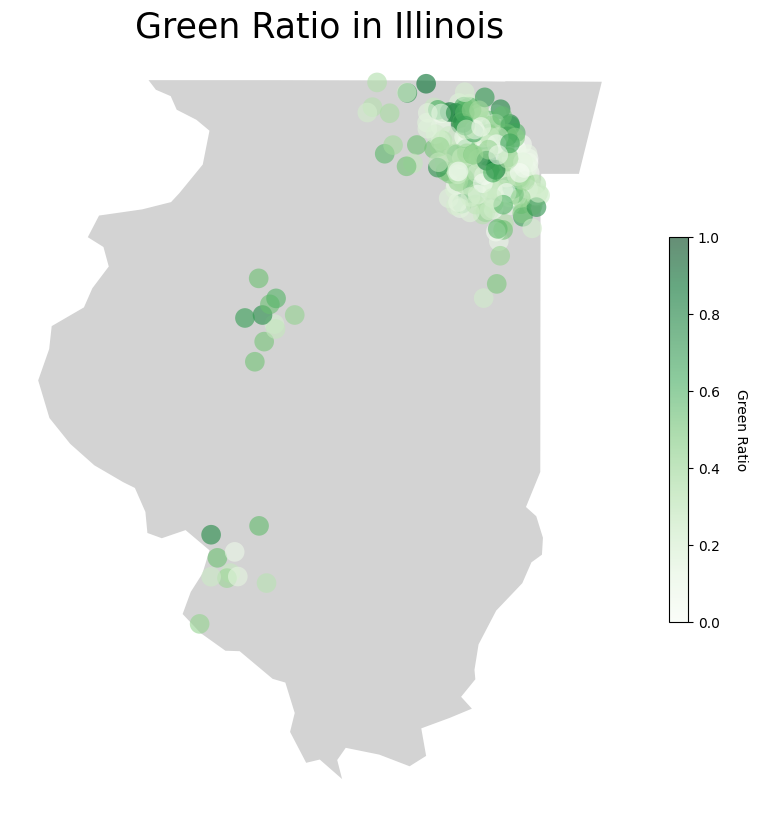

In [132]:
fig, ax = plt.subplots(figsize=(10, 10))
illinois.plot(ax=ax, color='lightgray')

# vmin, vmax = points_in_illinois['green_ratio'].min(), points_in_illinois['green_ratio'].max()
vmin, vmax = 0, 1

points_scatter = ax.scatter(points_in_illinois.geometry.x, points_in_illinois.geometry.y,
                            c=points_in_illinois['green_ratio'], cmap='Greens',
                            edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)

ax.axis('off')
ax.set_title('Green Ratio in Illinois', fontdict={'fontsize': '25', 'fontweight' : '3'})

cbar = fig.colorbar(points_scatter, ax=ax, shrink=0.5, aspect=20)
cbar.set_label('Green Ratio', rotation=270, labelpad=20)

plt.show()

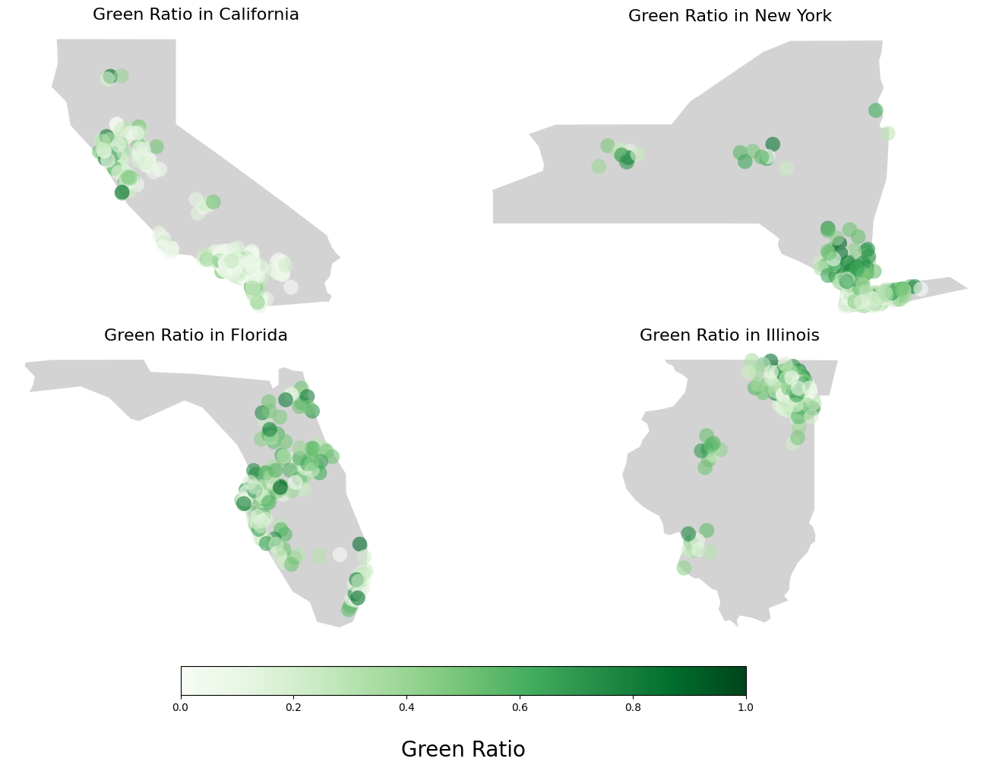

In [143]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)

vmin, vmax = 0, 1

california.plot(ax=axs[0, 0], color='lightgray')
points_in_california.plot(ax=axs[0, 0], column='green_ratio', cmap='Greens', edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)
axs[0, 0].set_title('Green Ratio in California', fontsize='16')

newyork.plot(ax=axs[0, 1], color='lightgray')
points_in_newyork.plot(ax=axs[0, 1], column='green_ratio', cmap='Greens', edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)
axs[0, 1].set_title('Green Ratio in New York', fontsize='16')

florida.plot(ax=axs[1, 0], color='lightgray')
points_in_florida.plot(ax=axs[1, 0], column='green_ratio', cmap='Greens', edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)
axs[1, 0].set_title('Green Ratio in Florida', fontsize='16')

illinois.plot(ax=axs[1, 1], color='lightgray')
points_in_illinois.plot(ax=axs[1, 1], column='green_ratio', cmap='Greens', edgecolor='none', linewidth=0.8, alpha=0.6, s=200, vmin=vmin, vmax=vmax)
axs[1, 1].set_title('Green Ratio in Illinois', fontsize='16')

# Add only one color bar for the entire figure
sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = fig.colorbar(sm, ax=axs, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('Green Ratio', fontsize='20', rotation=0, labelpad=25)

# Hide the axis for each subplot
for ax in axs.flatten():
    ax.axis('off')

plt.show()


In [176]:
mean_california = points_in_california['green_ratio'].mean()
mean_newyork = points_in_newyork['green_ratio'].mean()
mean_florida = points_in_florida['green_ratio'].mean()
mean_illinois = points_in_illinois['green_ratio'].mean()

# Creating a table (DataFrame) with the means
mean_green_ratios = pd.DataFrame({
    'State': ['California', 'New York', 'Florida', 'Illinois'],
    'Mean Green Ratio': [mean_california, mean_newyork, mean_florida, mean_illinois]
})
mean_green_ratios.T

,0,1,2,3
State,California,New York,Florida,Illinois
Mean Green Ratio,0.182531,0.364835,0.372521,0.332415


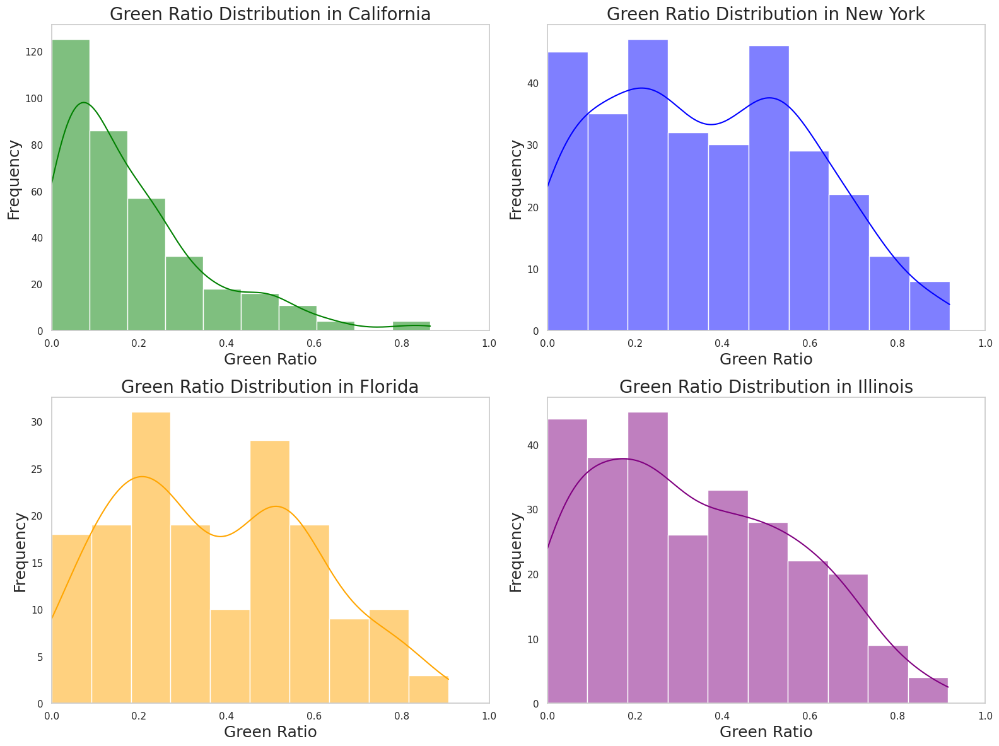

In [191]:
# Importing the seaborn library for plotting distribution plots
import seaborn as sns
import matplotlib.pyplot as plt

num_bins = 10

# Setting up the figure size and layout for the plots
plt.figure(figsize=(16, 12))

# Distribution plot for California
plt.subplot(2, 2, 1)  # 2 rows, 2 columns, 1st subplot
sns.histplot(points_in_california['green_ratio'], bins=num_bins, kde=True, color='green')
plt.title('Green Ratio Distribution in California', fontsize=20)
plt.xlabel('Green Ratio', fontsize=18)
plt.ylabel('Frequency', fontsize=18)
plt.xlim(left=0, right=1)
plt.grid(False)

# Distribution plot for New York
plt.subplot(2, 2, 2)  # 2nd subplot
sns.histplot(points_in_newyork['green_ratio'], bins=num_bins, kde=True, color='blue')
plt.title('Green Ratio Distribution in New York', fontsize=20)
plt.xlabel('Green Ratio', fontsize=18)
plt.ylabel('Frequency', fontsize=18)
plt.xlim(left=0, right=1)
plt.grid(False)

# Distribution plot for Florida
plt.subplot(2, 2, 3)  # 3rd subplot
sns.histplot(points_in_florida['green_ratio'], bins=num_bins, kde=True, color='orange')
plt.title('Green Ratio Distribution in Florida', fontsize=20)
plt.xlabel('Green Ratio', fontsize=18)
plt.ylabel('Frequency', fontsize=18)
plt.xlim(left=0, right=1)
plt.grid(False)

# Distribution plot for Illinois
plt.subplot(2, 2, 4)  # 4th subplot
sns.histplot(points_in_illinois['green_ratio'], bins=num_bins, kde=True, color='purple')
plt.title('Green Ratio Distribution in Illinois', fontsize=20)
plt.xlabel('Green Ratio', fontsize=18)
plt.ylabel('Frequency', fontsize=18)
plt.xlim(left=0, right=1)
plt.grid(False)

# Adjusting layout to prevent overlap
plt.tight_layout()
plt.show()